<a href="https://colab.research.google.com/github/richietrap/crowd_density/blob/main/crowd_density_project_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mounting Google Drive

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define your project path inside Drive (adjust if necessary)
project_path = '/content/drive/MyDrive/crowd_density_project'

# Change working directory to your project folder
os.chdir(project_path)

# Confirm path and contents
print(f"✅ Working directory set to: {os.getcwd()}")
print("📂 Project folder contents:")
print(os.listdir('.'))


Mounted at /content/drive
✅ Working directory set to: /content/drive/MyDrive/crowd_density_project
📂 Project folder contents:
['crowd_density_project.ipynb', 'models', 'results', 'data', '.ipynb_checkpoints', 'csrnet_best.pth', 'csrnet_best_v2.pth']


In [ ]:
!pip install opencv-python pandas matplotlib torch torchvision tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 75.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 55.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

#Confirming Project Directories

In [ ]:
import os

# Confirm base working directory
base_dir = os.getcwd()
print(f"📂 Current working directory: {base_dir}")

# Define project folders relative to base_dir
dirs = [
    "data/resized_images",
    "data/annotations",
    "data/density_maps",
    "data/train/images",
    "data/train/density_maps",
    "data/val/images",
    "data/val/density_maps",
    "data/test/images",
    "data/test/density_maps",
    "models",
    "results"
]

# Create only if directory doesn't exist
for dir_path in dirs:
    full_path = os.path.join(base_dir, dir_path)
    if not os.path.exists(full_path):
        try:
            os.makedirs(full_path)
            print(f"✅ Created: {full_path}")
        except Exception as e:
            print(f"❌ Error creating {full_path}: {e}")
    else:
        print(f"ℹ️ Already exists: {full_path}")

print("🎯 Directory structure check complete.")


📂 Current working directory: /content/drive/MyDrive/crowd_density_project
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/resized_images
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/annotations
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/density_maps
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/train/images
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/train/density_maps
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/val/images
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/val/density_maps
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/test/images
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/data/test/density_maps
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/models
ℹ️ Already exists: /content/drive/MyDrive/crowd_density_project/results
🎯 Directory structure check comp

##Validating Resized Images and Dimensions

In [ ]:
import os
import cv2
from tqdm import tqdm

# Directory containing resized images
resized_dir = "data/resized_images"
expected_width = 1280
expected_height = 720

# List all .jpg files
image_files = sorted([f for f in os.listdir(resized_dir) if f.lower().endswith(".jpg")])
total_images = len(image_files)

print(f"📂 Found {total_images} images in {resized_dir}.")
print(f"🔍 Validating dimensions: expected {expected_width}x{expected_height}...")

valid_images = 0
invalid_images = []

# Check each image
for img_file in tqdm(image_files, desc="🧪 Verifying image dimensions"):
    img_path = os.path.join(resized_dir, img_file)
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Could not read image: {img_file}")
        invalid_images.append((img_file, "Unreadable"))
        continue

    h, w = img.shape[:2]
    if (h, w) == (expected_height, expected_width):
        valid_images += 1
    else:
        print(f"⚠️ Image {img_file} has unexpected size: {w}x{h}")
        invalid_images.append((img_file, f"{w}x{h}"))

# Summary
print(f"\n✅ Validation complete: {valid_images}/{total_images} images meet the resolution requirement ({expected_width}x{expected_height}).")

if invalid_images:
    print("⚠️ Issues detected in the following files:")
    for fname, issue in invalid_images:
        print(f" - {fname}: {issue}")
else:
    print("🎯 All images are valid and ready for model input.")


📂 Found 800 images in data/resized_images.
🔍 Validating dimensions: expected 1280x720...


🧪 Verifying image dimensions: 100%|██████████| 800/800 [00:35<00:00, 22.30it/s]


✅ Validation complete: 800/800 images meet the resolution requirement (1280x720).
🎯 All images are valid and ready for model input.


#Removing Annotation Metadata (Parsing)

In [ ]:
import json
import os

# Paths
raw_annotation_file = "data/annotations/annotations.json"          # VIA export
cleaned_annotation_file = "data/annotations/annotations_parsed.json"  # Output file
image_dir = "data/resized_images"

# Load original VIA annotations
with open(raw_annotation_file, 'r') as f:
    raw_data = json.load(f)

parsed_annotations = {}
valid_image_files = set(os.listdir(image_dir))

# Parse and clean
for key, value in raw_data.items():
    filename = value.get("filename")
    regions = value.get("regions", [])

    if filename not in valid_image_files:
        print(f"⚠️ Skipping {filename} — not found in resized images.")
        continue

    points = []
    for region in regions:
        shape = region.get("shape_attributes", {})
        if shape.get("name") == "point":
            x = shape.get("cx")
            y = shape.get("cy")
            if x is not None and y is not None:
                points.append([x, y])

    if points:
        parsed_annotations[filename] = points

# Save cleaned JSON
with open(cleaned_annotation_file, 'w') as f:
    json.dump(parsed_annotations, f)

# Summary Output
print(f"✅ Parsed and cleaned annotations saved to: {cleaned_annotation_file}")
print(f"📊 Total annotated images: {len(parsed_annotations)}")


✅ Parsed and cleaned annotations saved to: data/annotations/annotations_parsed.json
📊 Total annotated images: 150


#Preview First 5 Annotated images

Total annotated images: 150


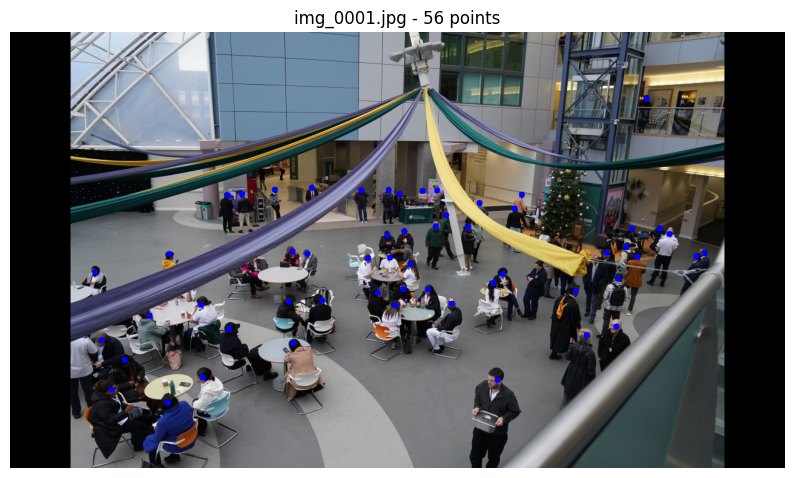

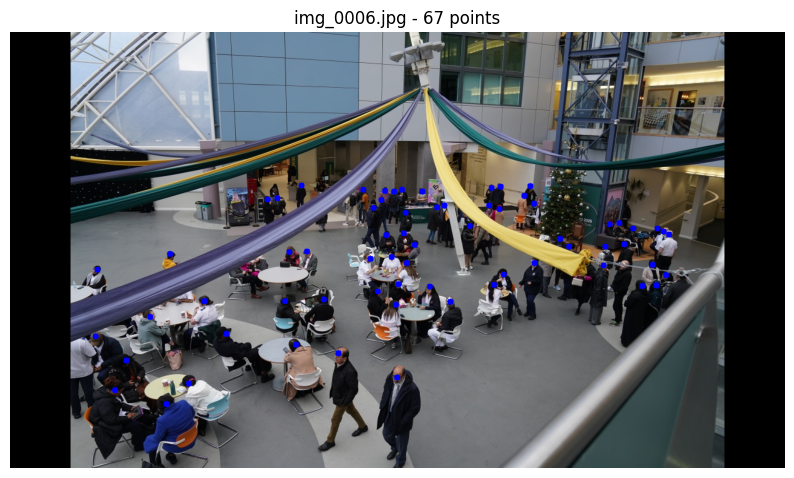

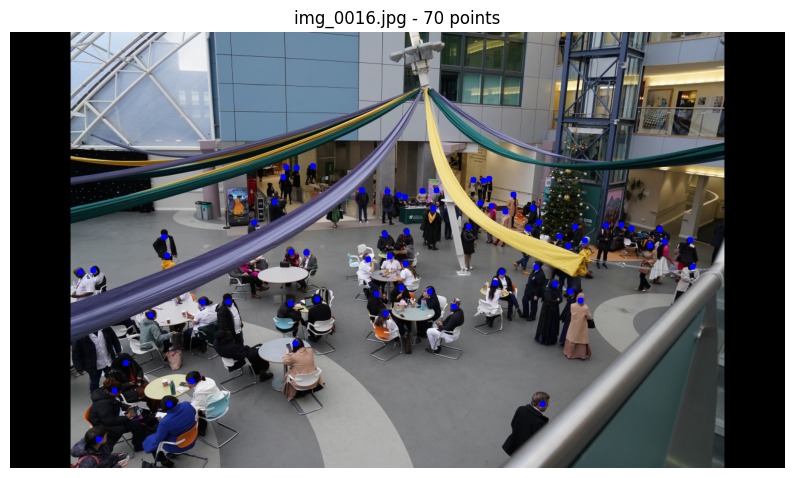

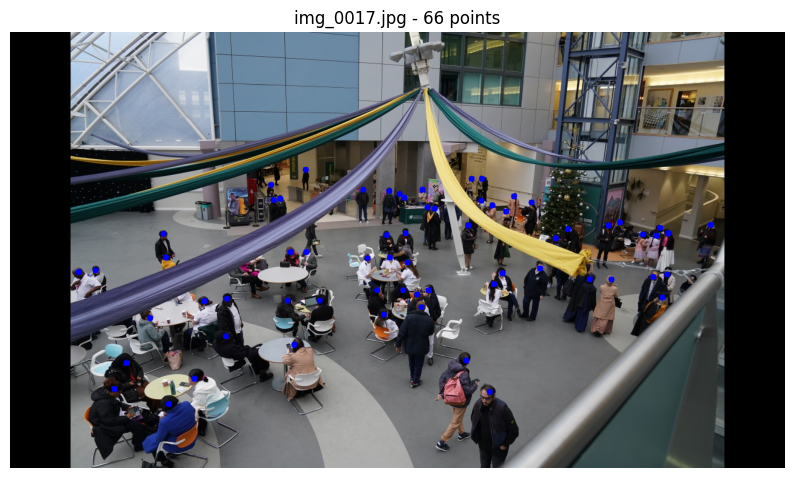

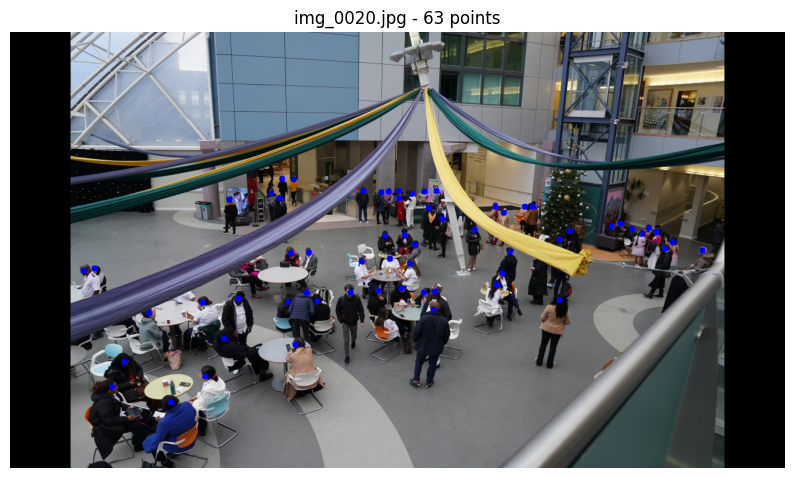

In [ ]:
import os
import json
import cv2
import matplotlib.pyplot as plt

# Set paths
image_dir = "data/resized_images"
annotation_file = "data/annotations/annotations_parsed.json"

# Load annotation JSON file
with open(annotation_file, "r") as f:
    annotations = json.load(f)

# Display function
def show_annotated_image(img_filename, points, dot_color=(255, 0, 0)):
    img_path = os.path.join(image_dir, img_filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"❌ Could not load image: {img_filename}")
        return

    # Validate and draw only numeric points
    valid_point_count = 0
    for point in points:
        try:
            x, y = int(float(point[0])), int(float(point[1]))  # Supports numeric strings like "105.0"
            cv2.circle(img, (x, y), radius=5, color=dot_color, thickness=-1)
            valid_point_count += 1
        except Exception as e:
            print(f"⚠️ Skipping invalid point in {img_filename}: {point} → {e}")
            continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f"{img_filename} - {valid_point_count} points")
    plt.axis('off')
    plt.show()


# Preview a few annotated images
annotated_imgs = list(annotations.keys())
print(f"Total annotated images: {len(annotated_imgs)}")

# Preview first 5 images
for img_name in annotated_imgs[:5]:
    show_annotated_image(img_name, annotations[img_name])


#Preview any annotated image by user input

🔍 Enter image filename to preview (e.g., img_0025.jpg): img_0114.jpg


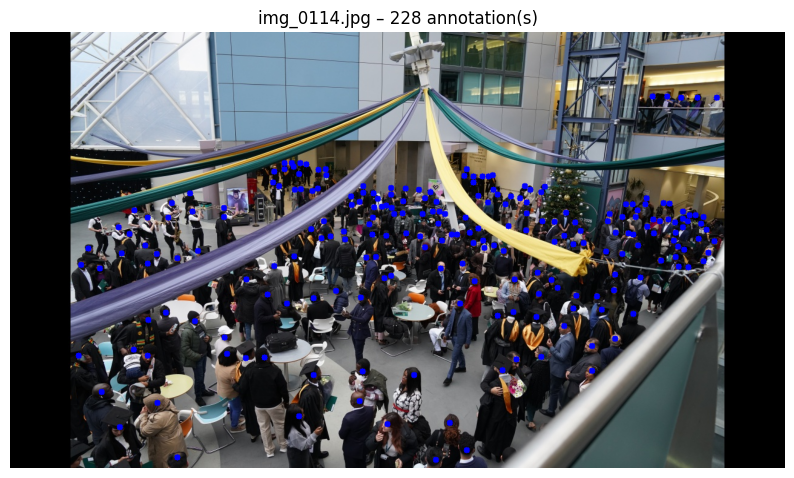

In [ ]:
import cv2
import json
import os
import matplotlib.pyplot as plt

# Set paths
image_dir = "data/resized_images"
annotation_file = "data/annotations/annotations_parsed.json"

# Load parsed annotations
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Display function
def preview_annotated_image(filename, point_color=(255, 0, 0)):
    img_path = os.path.join(image_dir, filename)

    if not os.path.exists(img_path):
        print(f"❌ Image not found: {filename}")
        return

    if filename not in annotations:
        print(f"⚠️ No annotations found for: {filename}")
        return

    points = annotations[filename]
    img = cv2.imread(img_path)

    if img is None:
        print(f"❌ Failed to load image: {filename}")
        return

    for point in points:
        try:
            x, y = int(float(point[0])), int(float(point[1]))
            cv2.circle(img, (x, y), radius=5, color=point_color, thickness=-1)
        except Exception as e:
            print(f"⚠️ Skipping invalid point {point}: {e}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f"{filename} – {len(points)} annotation(s)")
    plt.axis('off')
    plt.show()

# Prompt for image
user_input = input("🔍 Enter image filename to preview (e.g., img_0025.jpg): ").strip()
if user_input:
    preview_annotated_image(user_input)
else:
    print("⚠️ No filename entered.")


#Generating grayscale density maps

In [ ]:
import os
import cv2
import numpy as np
import json
from tqdm import tqdm

# Paths
resized_img_dir = "data/resized_images"
annotation_file = "data/annotations/annotations_parsed.json"
density_map_dir = "data/density_maps"
os.makedirs(density_map_dir, exist_ok=True)

# Load annotations
with open(annotation_file, "r") as f:
    annotations = json.load(f)

# Function to generate a density map with Gaussian blur
def generate_density_map(image_size, points, sigma=5):
    h, w = image_size
    density_map = np.zeros((h, w), dtype=np.float32)

    for point in points:
        try:
            x, y = int(float(point[0])), int(float(point[1]))
            if 0 <= x < w and 0 <= y < h:
                density_map[y, x] = 1
        except Exception as e:
            print(f"⚠️ Invalid point skipped: {point} - {e}")

    return cv2.GaussianBlur(density_map, (0, 0), sigma)

# Generate and save density maps
print("🛠️ Generating density maps (Numpy + PNG)...\n")

total = len(annotations)
saved_count = 0

for img_file, points in tqdm(annotations.items(), desc="🔄 Processing images"):
    img_path = os.path.join(resized_img_dir, img_file)
    if not os.path.exists(img_path):
        print(f"❌ Image not found: {img_file}")
        continue

    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Failed to load image: {img_file}")
        continue

    h, w = img.shape[:2]
    density_map = generate_density_map((h, w), points)

    # Paths
    base_name = img_file.replace(".jpg", "")
    npy_path = os.path.join(density_map_dir, f"{base_name}.npy")
    png_path = os.path.join(density_map_dir, f"{base_name}.png")

    # ✅ Save raw density map for training
    np.save(npy_path, density_map)

    # 🎨 Save visual-friendly 16-bit PNG scaled by 10,000
    density_map_visual = (density_map * 10000).astype(np.uint16)
    cv2.imwrite(png_path, density_map_visual)

    saved_count += 1
    print(f"✅ Saved: {base_name} → .npy + .png ({len(points)} points)")

# Summary
print(f"\n🎯 Density map generation complete: {saved_count}/{total} images processed successfully.")


🛠️ Generating density maps (Numpy + PNG)...



🔄 Processing images:   1%|          | 1/150 [00:04<11:59,  4.83s/it]

✅ Saved: img_0001 → .npy + .png (56 points)


🔄 Processing images:   1%|▏         | 2/150 [00:06<06:41,  2.71s/it]

✅ Saved: img_0006 → .npy + .png (67 points)


🔄 Processing images:   2%|▏         | 3/150 [00:07<05:21,  2.19s/it]

✅ Saved: img_0016 → .npy + .png (70 points)


🔄 Processing images:   3%|▎         | 4/150 [00:08<04:19,  1.78s/it]

✅ Saved: img_0017 → .npy + .png (66 points)


🔄 Processing images:   3%|▎         | 5/150 [00:09<03:48,  1.58s/it]

✅ Saved: img_0020 → .npy + .png (63 points)


🔄 Processing images:   4%|▍         | 6/150 [00:10<03:18,  1.38s/it]

✅ Saved: img_0031 → .npy + .png (66 points)


🔄 Processing images:   5%|▍         | 7/150 [00:12<03:02,  1.28s/it]

✅ Saved: img_0036 → .npy + .png (70 points)


🔄 Processing images:   5%|▌         | 8/150 [00:13<03:03,  1.29s/it]

✅ Saved: img_0037 → .npy + .png (70 points)


🔄 Processing images:   6%|▌         | 9/150 [00:14<02:52,  1.23s/it]

✅ Saved: img_0040 → .npy + .png (70 points)


🔄 Processing images:   7%|▋         | 10/150 [00:16<03:42,  1.59s/it]

✅ Saved: img_0041 → .npy + .png (70 points)


🔄 Processing images:   7%|▋         | 11/150 [00:18<03:49,  1.65s/it]

✅ Saved: img_0047 → .npy + .png (56 points)


🔄 Processing images:   8%|▊         | 12/150 [00:19<03:20,  1.45s/it]

✅ Saved: img_0051 → .npy + .png (74 points)


🔄 Processing images:   9%|▊         | 13/150 [00:20<03:09,  1.39s/it]

✅ Saved: img_0052 → .npy + .png (78 points)


🔄 Processing images:   9%|▉         | 14/150 [00:22<03:05,  1.37s/it]

✅ Saved: img_0061 → .npy + .png (75 points)


🔄 Processing images:  10%|█         | 15/150 [00:23<03:10,  1.41s/it]

✅ Saved: img_0067 → .npy + .png (96 points)


🔄 Processing images:  11%|█         | 16/150 [00:24<02:53,  1.30s/it]

✅ Saved: img_0070 → .npy + .png (98 points)


🔄 Processing images:  11%|█▏        | 17/150 [00:25<02:43,  1.23s/it]

✅ Saved: img_0072 → .npy + .png (105 points)


🔄 Processing images:  12%|█▏        | 18/150 [00:26<02:39,  1.21s/it]

✅ Saved: img_0073 → .npy + .png (119 points)


🔄 Processing images:  13%|█▎        | 19/150 [00:28<02:35,  1.19s/it]

✅ Saved: img_0074 → .npy + .png (121 points)


🔄 Processing images:  13%|█▎        | 20/150 [00:29<02:31,  1.17s/it]

✅ Saved: img_0076 → .npy + .png (123 points)


🔄 Processing images:  14%|█▍        | 21/150 [00:30<02:33,  1.19s/it]

✅ Saved: img_0078 → .npy + .png (126 points)


🔄 Processing images:  15%|█▍        | 22/150 [00:31<02:38,  1.24s/it]

✅ Saved: img_0080 → .npy + .png (147 points)


🔄 Processing images:  15%|█▌        | 23/150 [00:34<03:15,  1.54s/it]

✅ Saved: img_0085 → .npy + .png (160 points)


🔄 Processing images:  16%|█▌        | 24/150 [00:35<03:09,  1.50s/it]

✅ Saved: img_0088 → .npy + .png (162 points)


🔄 Processing images:  17%|█▋        | 25/150 [00:37<03:10,  1.52s/it]

✅ Saved: img_0089 → .npy + .png (133 points)


🔄 Processing images:  17%|█▋        | 26/150 [00:38<03:10,  1.54s/it]

✅ Saved: img_0099 → .npy + .png (179 points)


🔄 Processing images:  18%|█▊        | 27/150 [00:40<03:05,  1.51s/it]

✅ Saved: img_0104 → .npy + .png (196 points)


🔄 Processing images:  19%|█▊        | 28/150 [00:41<02:53,  1.42s/it]

✅ Saved: img_0106 → .npy + .png (179 points)


🔄 Processing images:  19%|█▉        | 29/150 [00:42<02:47,  1.38s/it]

✅ Saved: img_0108 → .npy + .png (199 points)


🔄 Processing images:  20%|██        | 30/150 [00:43<02:35,  1.30s/it]

✅ Saved: img_0110 → .npy + .png (217 points)


🔄 Processing images:  21%|██        | 31/150 [00:45<02:45,  1.39s/it]

✅ Saved: img_0114 → .npy + .png (228 points)


🔄 Processing images:  21%|██▏       | 32/150 [00:46<02:38,  1.34s/it]

✅ Saved: img_0116 → .npy + .png (208 points)


🔄 Processing images:  22%|██▏       | 33/150 [00:47<02:28,  1.27s/it]

✅ Saved: img_0124 → .npy + .png (238 points)


🔄 Processing images:  23%|██▎       | 34/150 [00:48<02:26,  1.27s/it]

✅ Saved: img_0126 → .npy + .png (210 points)


🔄 Processing images:  23%|██▎       | 35/150 [00:50<02:29,  1.30s/it]

✅ Saved: img_0128 → .npy + .png (222 points)


🔄 Processing images:  24%|██▍       | 36/150 [00:51<02:28,  1.30s/it]

✅ Saved: img_0130 → .npy + .png (220 points)


🔄 Processing images:  25%|██▍       | 37/150 [00:52<02:23,  1.27s/it]

✅ Saved: img_0133 → .npy + .png (225 points)


🔄 Processing images:  25%|██▌       | 38/150 [00:54<02:33,  1.37s/it]

✅ Saved: img_0139 → .npy + .png (226 points)


🔄 Processing images:  26%|██▌       | 39/150 [00:55<02:27,  1.33s/it]

✅ Saved: img_0150 → .npy + .png (224 points)


🔄 Processing images:  27%|██▋       | 40/150 [00:57<02:40,  1.46s/it]

✅ Saved: img_0152 → .npy + .png (222 points)


🔄 Processing images:  27%|██▋       | 41/150 [00:58<02:39,  1.47s/it]

✅ Saved: img_0156 → .npy + .png (235 points)


🔄 Processing images:  28%|██▊       | 42/150 [01:00<02:34,  1.43s/it]

✅ Saved: img_0159 → .npy + .png (219 points)


🔄 Processing images:  29%|██▊       | 43/150 [01:01<02:38,  1.48s/it]

✅ Saved: img_0162 → .npy + .png (215 points)


🔄 Processing images:  29%|██▉       | 44/150 [01:03<02:28,  1.40s/it]

✅ Saved: img_0163 → .npy + .png (209 points)


🔄 Processing images:  30%|███       | 45/150 [01:04<02:27,  1.40s/it]

✅ Saved: img_0172 → .npy + .png (199 points)


🔄 Processing images:  31%|███       | 46/150 [01:05<02:16,  1.32s/it]

✅ Saved: img_0182 → .npy + .png (194 points)


🔄 Processing images:  31%|███▏      | 47/150 [01:07<02:21,  1.38s/it]

✅ Saved: img_0188 → .npy + .png (187 points)


🔄 Processing images:  32%|███▏      | 48/150 [01:08<02:37,  1.55s/it]

✅ Saved: img_0191 → .npy + .png (175 points)


🔄 Processing images:  33%|███▎      | 49/150 [01:10<02:22,  1.41s/it]

✅ Saved: img_0194 → .npy + .png (178 points)


🔄 Processing images:  33%|███▎      | 50/150 [01:11<02:07,  1.28s/it]

✅ Saved: img_0200 → .npy + .png (173 points)


🔄 Processing images:  34%|███▍      | 51/150 [01:12<01:58,  1.20s/it]

✅ Saved: img_0204 → .npy + .png (174 points)


🔄 Processing images:  35%|███▍      | 52/150 [01:13<01:56,  1.19s/it]

✅ Saved: img_0207 → .npy + .png (171 points)


🔄 Processing images:  35%|███▌      | 53/150 [01:14<01:59,  1.24s/it]

✅ Saved: img_0210 → .npy + .png (167 points)


🔄 Processing images:  36%|███▌      | 54/150 [01:15<01:55,  1.20s/it]

✅ Saved: img_0216 → .npy + .png (174 points)


🔄 Processing images:  37%|███▋      | 55/150 [01:16<01:50,  1.16s/it]

✅ Saved: img_0229 → .npy + .png (162 points)


🔄 Processing images:  37%|███▋      | 56/150 [01:17<01:50,  1.18s/it]

✅ Saved: img_0236 → .npy + .png (155 points)


🔄 Processing images:  38%|███▊      | 57/150 [01:19<01:45,  1.14s/it]

✅ Saved: img_0239 → .npy + .png (157 points)


🔄 Processing images:  39%|███▊      | 58/150 [01:20<01:42,  1.12s/it]

✅ Saved: img_0242 → .npy + .png (148 points)


🔄 Processing images:  39%|███▉      | 59/150 [01:21<01:42,  1.13s/it]

✅ Saved: img_0247 → .npy + .png (172 points)


🔄 Processing images:  40%|████      | 60/150 [01:23<02:10,  1.45s/it]

✅ Saved: img_0252 → .npy + .png (163 points)


🔄 Processing images:  41%|████      | 61/150 [01:24<02:09,  1.46s/it]

✅ Saved: img_0258 → .npy + .png (150 points)


🔄 Processing images:  41%|████▏     | 62/150 [01:26<02:17,  1.56s/it]

✅ Saved: img_0264 → .npy + .png (149 points)


🔄 Processing images:  42%|████▏     | 63/150 [01:27<02:06,  1.46s/it]

✅ Saved: img_0270 → .npy + .png (146 points)


🔄 Processing images:  43%|████▎     | 64/150 [01:29<02:14,  1.56s/it]

✅ Saved: img_0275 → .npy + .png (161 points)


🔄 Processing images:  43%|████▎     | 65/150 [01:30<01:58,  1.39s/it]

✅ Saved: img_0281 → .npy + .png (149 points)


🔄 Processing images:  44%|████▍     | 66/150 [01:31<01:53,  1.35s/it]

✅ Saved: img_0284 → .npy + .png (144 points)


🔄 Processing images:  45%|████▍     | 67/150 [01:33<01:49,  1.32s/it]

✅ Saved: img_0291 → .npy + .png (147 points)


🔄 Processing images:  45%|████▌     | 68/150 [01:35<02:10,  1.59s/it]

✅ Saved: img_0294 → .npy + .png (149 points)


🔄 Processing images:  46%|████▌     | 69/150 [01:36<02:04,  1.54s/it]

✅ Saved: img_0301 → .npy + .png (142 points)


🔄 Processing images:  47%|████▋     | 70/150 [01:37<01:51,  1.40s/it]

✅ Saved: img_0305 → .npy + .png (138 points)


🔄 Processing images:  47%|████▋     | 71/150 [01:39<01:48,  1.38s/it]

✅ Saved: img_0311 → .npy + .png (137 points)


🔄 Processing images:  48%|████▊     | 72/150 [01:41<02:09,  1.66s/it]

✅ Saved: img_0318 → .npy + .png (135 points)


🔄 Processing images:  49%|████▊     | 73/150 [01:42<01:58,  1.54s/it]

✅ Saved: img_0323 → .npy + .png (129 points)


🔄 Processing images:  49%|████▉     | 74/150 [01:44<01:57,  1.54s/it]

✅ Saved: img_0327 → .npy + .png (131 points)


🔄 Processing images:  50%|█████     | 75/150 [01:45<01:55,  1.54s/it]

✅ Saved: img_0328 → .npy + .png (127 points)


🔄 Processing images:  51%|█████     | 76/150 [01:47<01:48,  1.46s/it]

✅ Saved: img_0335 → .npy + .png (110 points)


🔄 Processing images:  51%|█████▏    | 77/150 [01:48<01:40,  1.37s/it]

✅ Saved: img_0341 → .npy + .png (101 points)


🔄 Processing images:  52%|█████▏    | 78/150 [01:49<01:33,  1.29s/it]

✅ Saved: img_0345 → .npy + .png (106 points)


🔄 Processing images:  53%|█████▎    | 79/150 [01:50<01:24,  1.20s/it]

✅ Saved: img_0356 → .npy + .png (112 points)


🔄 Processing images:  53%|█████▎    | 80/150 [01:51<01:26,  1.23s/it]

✅ Saved: img_0358 → .npy + .png (99 points)


🔄 Processing images:  54%|█████▍    | 81/150 [01:53<01:30,  1.31s/it]

✅ Saved: img_0379 → .npy + .png (102 points)


🔄 Processing images:  55%|█████▍    | 82/150 [01:54<01:28,  1.30s/it]

✅ Saved: img_0390 → .npy + .png (109 points)


🔄 Processing images:  55%|█████▌    | 83/150 [01:55<01:20,  1.20s/it]

✅ Saved: img_0391 → .npy + .png (106 points)


🔄 Processing images:  56%|█████▌    | 84/150 [01:56<01:15,  1.14s/it]

✅ Saved: img_0392 → .npy + .png (105 points)


🔄 Processing images:  57%|█████▋    | 85/150 [01:57<01:16,  1.17s/it]

✅ Saved: img_0399 → .npy + .png (93 points)


🔄 Processing images:  57%|█████▋    | 86/150 [01:58<01:13,  1.15s/it]

✅ Saved: img_0404 → .npy + .png (97 points)


🔄 Processing images:  58%|█████▊    | 87/150 [02:00<01:13,  1.17s/it]

✅ Saved: img_0409 → .npy + .png (119 points)


🔄 Processing images:  59%|█████▊    | 88/150 [02:01<01:20,  1.29s/it]

✅ Saved: img_0422 → .npy + .png (102 points)


🔄 Processing images:  59%|█████▉    | 89/150 [02:03<01:20,  1.32s/it]

✅ Saved: img_0427 → .npy + .png (96 points)


🔄 Processing images:  60%|██████    | 90/150 [02:04<01:13,  1.22s/it]

✅ Saved: img_0439 → .npy + .png (105 points)


🔄 Processing images:  61%|██████    | 91/150 [02:05<01:09,  1.17s/it]

✅ Saved: img_0441 → .npy + .png (102 points)


🔄 Processing images:  61%|██████▏   | 92/150 [02:06<01:13,  1.27s/it]

✅ Saved: img_0448 → .npy + .png (107 points)


🔄 Processing images:  62%|██████▏   | 93/150 [02:07<01:11,  1.25s/it]

✅ Saved: img_0449 → .npy + .png (104 points)


🔄 Processing images:  63%|██████▎   | 94/150 [02:08<01:06,  1.19s/it]

✅ Saved: img_0453 → .npy + .png (98 points)


🔄 Processing images:  63%|██████▎   | 95/150 [02:10<01:05,  1.19s/it]

✅ Saved: img_0467 → .npy + .png (88 points)


🔄 Processing images:  64%|██████▍   | 96/150 [02:11<01:04,  1.19s/it]

✅ Saved: img_0471 → .npy + .png (89 points)


🔄 Processing images:  65%|██████▍   | 97/150 [02:12<01:05,  1.24s/it]

✅ Saved: img_0475 → .npy + .png (95 points)


🔄 Processing images:  65%|██████▌   | 98/150 [02:13<01:00,  1.17s/it]

✅ Saved: img_0484 → .npy + .png (56 points)


🔄 Processing images:  66%|██████▌   | 99/150 [02:14<00:57,  1.12s/it]

✅ Saved: img_0488 → .npy + .png (72 points)


🔄 Processing images:  67%|██████▋   | 100/150 [02:16<01:12,  1.44s/it]

✅ Saved: img_0497 → .npy + .png (69 points)


🔄 Processing images:  67%|██████▋   | 101/150 [02:17<01:05,  1.33s/it]

✅ Saved: img_0501 → .npy + .png (60 points)


🔄 Processing images:  68%|██████▊   | 102/150 [02:18<00:59,  1.25s/it]

✅ Saved: img_0506 → .npy + .png (61 points)


🔄 Processing images:  69%|██████▊   | 103/150 [02:20<00:57,  1.23s/it]

✅ Saved: img_0514 → .npy + .png (60 points)


🔄 Processing images:  69%|██████▉   | 104/150 [02:21<00:58,  1.27s/it]

✅ Saved: img_0518 → .npy + .png (61 points)


🔄 Processing images:  70%|███████   | 105/150 [02:22<00:56,  1.25s/it]

✅ Saved: img_0524 → .npy + .png (62 points)


🔄 Processing images:  71%|███████   | 106/150 [02:23<00:55,  1.26s/it]

✅ Saved: img_0531 → .npy + .png (64 points)


🔄 Processing images:  71%|███████▏  | 107/150 [02:25<00:53,  1.24s/it]

✅ Saved: img_0534 → .npy + .png (58 points)


🔄 Processing images:  72%|███████▏  | 108/150 [02:26<00:52,  1.26s/it]

✅ Saved: img_0538 → .npy + .png (56 points)


🔄 Processing images:  73%|███████▎  | 109/150 [02:27<00:51,  1.25s/it]

✅ Saved: img_0545 → .npy + .png (66 points)


🔄 Processing images:  73%|███████▎  | 110/150 [02:28<00:47,  1.19s/it]

✅ Saved: img_0548 → .npy + .png (68 points)


🔄 Processing images:  74%|███████▍  | 111/150 [02:29<00:46,  1.20s/it]

✅ Saved: img_0550 → .npy + .png (63 points)


🔄 Processing images:  75%|███████▍  | 112/150 [02:31<00:49,  1.29s/it]

✅ Saved: img_0563 → .npy + .png (62 points)


🔄 Processing images:  75%|███████▌  | 113/150 [02:32<00:44,  1.21s/it]

✅ Saved: img_0575 → .npy + .png (64 points)


🔄 Processing images:  76%|███████▌  | 114/150 [02:33<00:42,  1.18s/it]

✅ Saved: img_0578 → .npy + .png (59 points)


🔄 Processing images:  77%|███████▋  | 115/150 [02:34<00:40,  1.16s/it]

✅ Saved: img_0581 → .npy + .png (63 points)


🔄 Processing images:  77%|███████▋  | 116/150 [02:35<00:38,  1.13s/it]

✅ Saved: img_0584 → .npy + .png (49 points)


🔄 Processing images:  78%|███████▊  | 117/150 [02:37<00:38,  1.18s/it]

✅ Saved: img_0585 → .npy + .png (48 points)


🔄 Processing images:  79%|███████▊  | 118/150 [02:38<00:36,  1.16s/it]

✅ Saved: img_0590 → .npy + .png (44 points)


🔄 Processing images:  79%|███████▉  | 119/150 [02:39<00:35,  1.15s/it]

✅ Saved: img_0600 → .npy + .png (46 points)


🔄 Processing images:  80%|████████  | 120/150 [02:40<00:34,  1.15s/it]

✅ Saved: img_0603 → .npy + .png (46 points)


🔄 Processing images:  81%|████████  | 121/150 [02:41<00:34,  1.18s/it]

✅ Saved: img_0612 → .npy + .png (53 points)


🔄 Processing images:  81%|████████▏ | 122/150 [02:42<00:30,  1.11s/it]

✅ Saved: img_0623 → .npy + .png (60 points)


🔄 Processing images:  82%|████████▏ | 123/150 [02:43<00:31,  1.16s/it]

✅ Saved: img_0626 → .npy + .png (57 points)


🔄 Processing images:  83%|████████▎ | 124/150 [02:44<00:28,  1.11s/it]

✅ Saved: img_0636 → .npy + .png (56 points)


🔄 Processing images:  83%|████████▎ | 125/150 [02:46<00:29,  1.19s/it]

✅ Saved: img_0647 → .npy + .png (60 points)


🔄 Processing images:  84%|████████▍ | 126/150 [02:47<00:27,  1.13s/it]

✅ Saved: img_0650 → .npy + .png (54 points)


🔄 Processing images:  85%|████████▍ | 127/150 [02:48<00:28,  1.25s/it]

✅ Saved: img_0652 → .npy + .png (51 points)


🔄 Processing images:  85%|████████▌ | 128/150 [02:49<00:25,  1.15s/it]

✅ Saved: img_0657 → .npy + .png (53 points)


🔄 Processing images:  86%|████████▌ | 129/150 [02:50<00:22,  1.09s/it]

✅ Saved: img_0663 → .npy + .png (53 points)


🔄 Processing images:  87%|████████▋ | 130/150 [02:51<00:21,  1.06s/it]

✅ Saved: img_0669 → .npy + .png (54 points)


🔄 Processing images:  87%|████████▋ | 131/150 [02:52<00:20,  1.09s/it]

✅ Saved: img_0675 → .npy + .png (46 points)


🔄 Processing images:  88%|████████▊ | 132/150 [02:53<00:18,  1.04s/it]

✅ Saved: img_0678 → .npy + .png (54 points)


🔄 Processing images:  89%|████████▊ | 133/150 [02:54<00:18,  1.08s/it]

✅ Saved: img_0689 → .npy + .png (53 points)


🔄 Processing images:  89%|████████▉ | 134/150 [02:56<00:17,  1.10s/it]

✅ Saved: img_0692 → .npy + .png (57 points)


🔄 Processing images:  90%|█████████ | 135/150 [02:57<00:16,  1.09s/it]

✅ Saved: img_0703 → .npy + .png (45 points)


🔄 Processing images:  91%|█████████ | 136/150 [02:58<00:14,  1.07s/it]

✅ Saved: img_0708 → .npy + .png (54 points)


🔄 Processing images:  91%|█████████▏| 137/150 [02:59<00:15,  1.21s/it]

✅ Saved: img_0713 → .npy + .png (58 points)


🔄 Processing images:  92%|█████████▏| 138/150 [03:00<00:13,  1.12s/it]

✅ Saved: img_0717 → .npy + .png (60 points)


🔄 Processing images:  93%|█████████▎| 139/150 [03:01<00:12,  1.13s/it]

✅ Saved: img_0729 → .npy + .png (54 points)


🔄 Processing images:  93%|█████████▎| 140/150 [03:02<00:10,  1.10s/it]

✅ Saved: img_0742 → .npy + .png (59 points)


🔄 Processing images:  94%|█████████▍| 141/150 [03:06<00:15,  1.77s/it]

✅ Saved: img_0744 → .npy + .png (57 points)


🔄 Processing images:  95%|█████████▍| 142/150 [03:07<00:13,  1.70s/it]

✅ Saved: img_0747 → .npy + .png (60 points)


🔄 Processing images:  95%|█████████▌| 143/150 [03:08<00:10,  1.47s/it]

✅ Saved: img_0756 → .npy + .png (51 points)


🔄 Processing images:  96%|█████████▌| 144/150 [03:09<00:08,  1.45s/it]

✅ Saved: img_0763 → .npy + .png (58 points)


🔄 Processing images:  97%|█████████▋| 145/150 [03:10<00:06,  1.32s/it]

✅ Saved: img_0767 → .npy + .png (57 points)


🔄 Processing images:  97%|█████████▋| 146/150 [03:12<00:05,  1.35s/it]

✅ Saved: img_0768 → .npy + .png (62 points)


🔄 Processing images:  98%|█████████▊| 147/150 [03:13<00:03,  1.33s/it]

✅ Saved: img_0780 → .npy + .png (67 points)


🔄 Processing images:  99%|█████████▊| 148/150 [03:14<00:02,  1.22s/it]

✅ Saved: img_0793 → .npy + .png (61 points)


🔄 Processing images:  99%|█████████▉| 149/150 [03:15<00:01,  1.20s/it]

✅ Saved: img_0797 → .npy + .png (63 points)


🔄 Processing images: 100%|██████████| 150/150 [03:16<00:00,  1.31s/it]

✅ Saved: img_0800 → .npy + .png (64 points)

🎯 Density map generation complete: 150/150 images processed successfully.


#Display Image + Density Map for User Specified Image

🔍 Enter image filename to preview (e.g., img_0032.jpg): img_0114.jpg


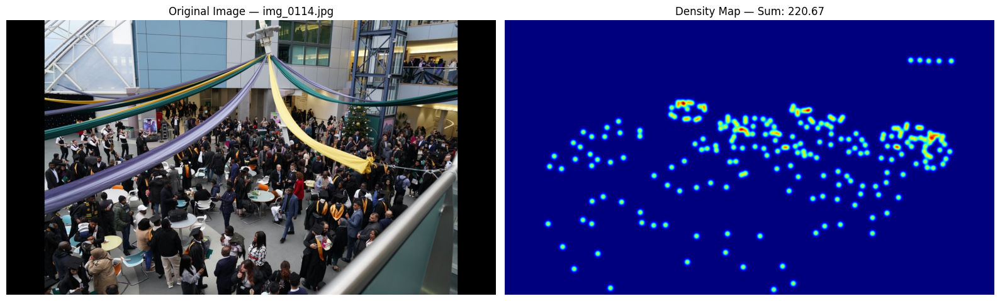

In [ ]:
import os
import json
import cv2
import matplotlib.pyplot as plt

# Paths
img_dir = "data/resized_images"
density_map_dir = "data/density_maps"
annotation_file = "data/annotations/annotations_parsed.json"

# Load list of annotated images
with open(annotation_file, "r") as f:
    annotations = json.load(f)

# Function to preview image and corresponding density map
def preview_image_and_density(filename):
    img_path = os.path.join(img_dir, filename)
    density_map_path = os.path.join(density_map_dir, filename.replace(".jpg", ".png"))

    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Could not load image: {filename}")
        return
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load 16-bit PNG density map (visualisation only)
    density_map = cv2.imread(density_map_path, cv2.IMREAD_UNCHANGED)
    if density_map is None:
        print(f"❌ Could not load density map: {density_map_path}")
        return

    density_map = density_map.astype(np.float32) / 10000.0  # Reverse scale

    # Display side-by-side
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))

    axs[0].imshow(img_rgb)
    axs[0].set_title(f"Original Image — {filename}")
    axs[0].axis("off")

    axs[1].imshow(density_map, cmap="jet")
    axs[1].set_title(f"Density Map — Sum: {density_map.sum():.2f}")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()


# Get user input (or fallback message)
filename_input = input("🔍 Enter image filename to preview (e.g., img_0032.jpg): ").strip()
if filename_input:
    preview_image_and_density(filename_input)
else:
    print("⚠️ No filename entered. Please re-run the cell and enter a valid image name.")


#Overlay Dot Annotations on Top of Density Map

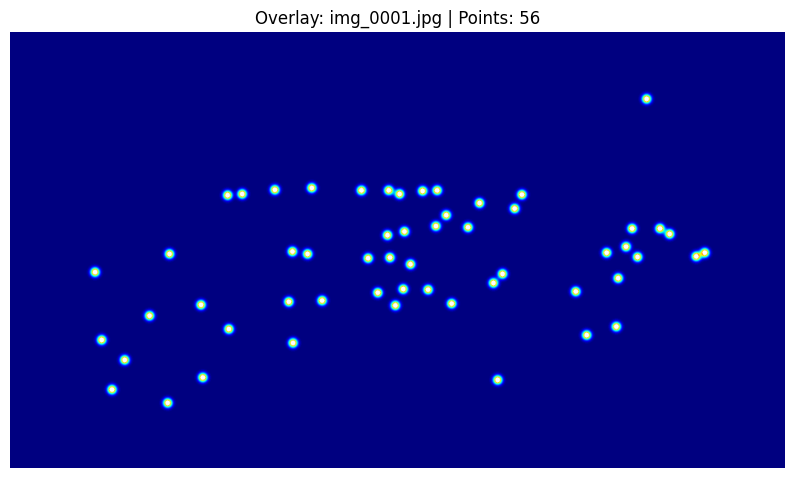

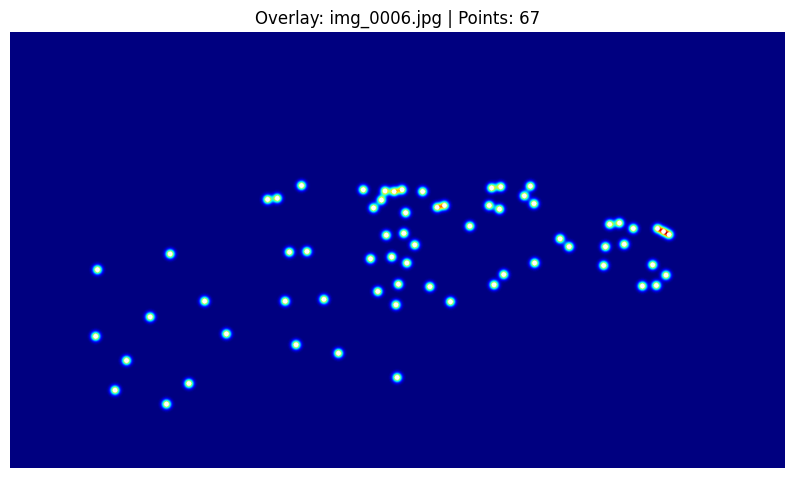

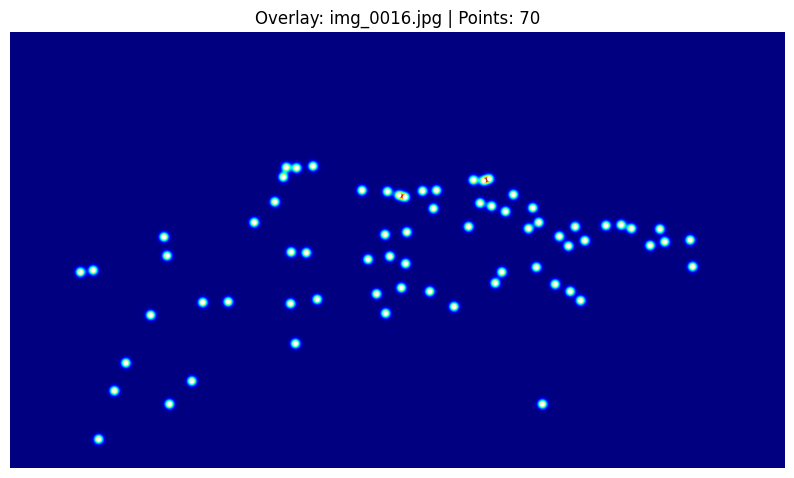

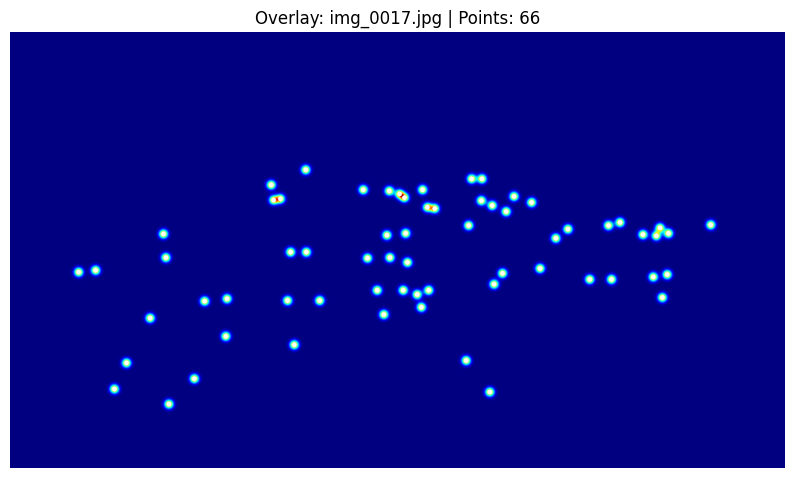

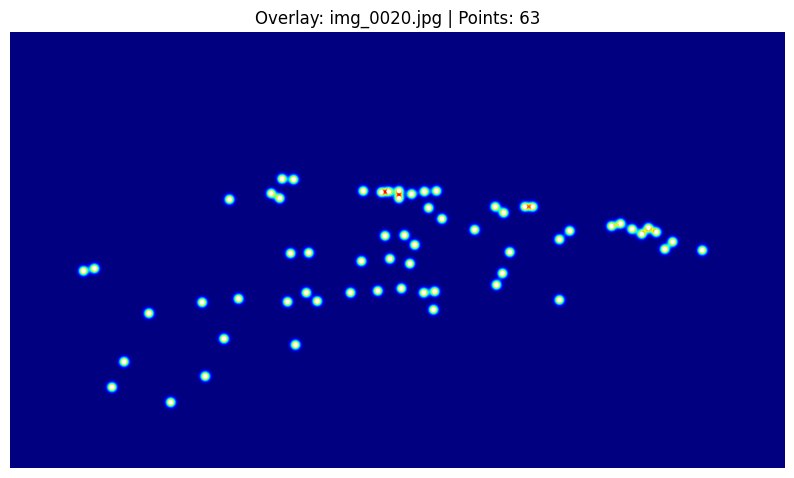

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
import json

# Set paths
image_dir = "data/resized_images"
density_map_dir = "data/density_maps"
annotation_file = "data/annotations/annotations_parsed.json"

# Load parsed annotations
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Get first 5 files to check
preview_files = list(annotations.keys())[:5]

def overlay_annotations_on_density_map(filename, point_color=(255, 255, 255)):
    img_path = os.path.join(image_dir, filename)
    density_map_path = os.path.join(density_map_dir, filename.replace(".jpg", ".png"))

    if not os.path.exists(img_path) or not os.path.exists(density_map_path):
        print(f"❌ Missing files for {filename}")
        return

    # ✅ Load full 16-bit density map and scale back to float
    density_map = cv2.imread(density_map_path, cv2.IMREAD_UNCHANGED)
    if density_map is None:
        print(f"❌ Could not load density map for {filename}")
        return
    density_map = density_map.astype(np.float32) / 10000.0

    # ✅ Normalise for visualisation
    norm_density = density_map / (density_map.max() + 1e-5)
    norm_density_coloured = cv2.applyColorMap((norm_density * 255).astype(np.uint8), cv2.COLORMAP_JET)

    # Overlay annotation points as white dots
    for point in annotations[filename]:
        try:
            x, y = int(float(point[0])), int(float(point[1]))
            cv2.circle(norm_density_coloured, (x, y), radius=4, color=point_color, thickness=-1)
        except Exception as e:
            print(f"⚠️ Skipping bad point in {filename}: {point} → {e}")

    # Convert to RGB for matplotlib
    display_img = cv2.cvtColor(norm_density_coloured, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.imshow(display_img)
    plt.title(f"Overlay: {filename} | Points: {len(annotations[filename])}")
    plt.axis('off')
    plt.show()

# 🔍 Run the overlay preview for the first 5 annotated images
for file in preview_files:
    overlay_annotations_on_density_map(file)


#Legend for Interpreting Density Maps (jet colormap)

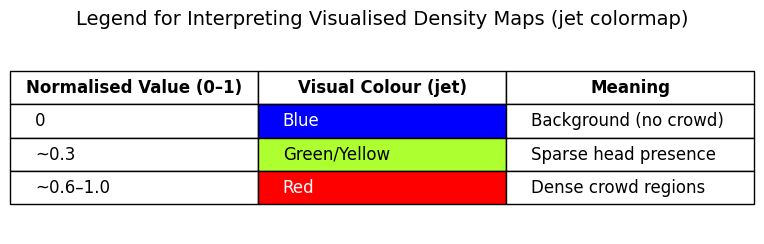

In [ ]:
import matplotlib.pyplot as plt

# Define content for the table
cell_text = [
    ["0", "Blue", "Background (no crowd)"],
    ["~0.3", "Green/Yellow", "Sparse head presence"],
    ["~0.6–1.0", "Red", "Dense crowd regions"]
]

column_labels = ["Normalised Value (0–1)", "Visual Colour (jet)", "Meaning"]


# Create the figure and axis
fig, ax = plt.subplots(figsize=(8, 2.5))
ax.axis('tight')
ax.axis('off')

# Create the table
table = ax.table(cellText=cell_text, colLabels=column_labels, loc='center')

# Font and scale settings
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 2)

# Align text to the left for better readability
for (row, col), cell in table.get_celld().items():
    if row == 0:  # Header
        cell.set_text_props(ha='center', va='center', weight='bold')
    else:
        cell.set_text_props(ha='left', va='center')

# Colour map for the 'Visual Colour' column
colour_map = {
    "Blue": "#0000FF",
    "Green/Yellow": "#ADFF2F",
    "Red": "#FF0000"
}

# Apply cell colour highlighting
for i, row in enumerate(cell_text):
    colour = colour_map.get(row[1], "#FFFFFF")
    table[(i + 1, 1)].set_facecolor(colour)
    table[(i + 1, 1)].set_text_props(color='white' if colour != "#ADFF2F" else 'black')

# Title
plt.title("Legend for Interpreting Visualised Density Maps (jet colormap)", fontsize=14, pad=12)
plt.show()


#Generate CSV (Ground Truth) with Crowd Count Per Image

In [ ]:
import os
import json
import pandas as pd

# Paths
annotation_file = "data/annotations/annotations_parsed.json"
output_csv = "data/crowd_counts.csv"

# Load annotations
if not os.path.exists(annotation_file):
    raise FileNotFoundError(f"❌ Annotation file not found: {annotation_file}")

with open(annotation_file, "r") as f:
    annotations = json.load(f)

# Build DataFrame of counts
rows = []
for filename, points in annotations.items():
    count = len(points)
    rows.append({"filename": filename, "ground_truth_count": count})

df = pd.DataFrame(rows)

# Save to CSV
df.to_csv(output_csv, index=False)

# Summary Output
print(f"✅ Crowd count summary saved to: {output_csv}")
print(f"📊 Total annotated images: {len(df)}")
print(f"👥 Average crowd size: {df['ground_truth_count'].mean():.2f}")

# Preview the first few rows
print("\n🔍 Preview of CSV content:")
print(df.head())


✅ Crowd count summary saved to: data/crowd_counts.csv
📊 Total annotated images: 150
👥 Average crowd size: 110.59

🔍 Preview of CSV content:
       filename  ground_truth_count
0  img_0001.jpg                  56
1  img_0006.jpg                  67
2  img_0016.jpg                  70
3  img_0017.jpg                  66
4  img_0020.jpg                  63


#Split Annotated Dataset with CSV Log

In [ ]:
import os
import shutil
import json
import random
import pandas as pd

# === Paths ===
annotation_file = "data/annotations/annotations_parsed.json"
image_dir = "data/resized_images"
density_dir = "data/density_maps"  # Source of both .npy and .png
output_csv = "data/split_log.csv"

# === Split Sizes ===
train_count = 105
val_count = 20
test_count = 20

# === Prepare Output Folders ===
splits = ["train", "val", "test"]
for split in splits:
    os.makedirs(f"data/{split}/images", exist_ok=True)
    os.makedirs(f"data/{split}/density_maps", exist_ok=True)       # For .png (visualisation)
    os.makedirs(f"data/{split}/density_maps_npy", exist_ok=True)   # For .npy (training)

# === Load Annotated Filenames ===
with open(annotation_file, "r") as f:
    all_filenames = list(json.load(f).keys())

print(f"📦 Total annotated images to split: {len(all_filenames)}")

# === Reproducible Shuffle ===
random.seed(42)
random.shuffle(all_filenames)

# === Split Allocation ===
train_files = all_filenames[:train_count]
val_files = all_filenames[train_count:train_count + val_count]
test_files = all_filenames[train_count + val_count:train_count + val_count + test_count]

# === Copy Function ===
def copy_files(file_list, split_name):
    copied = 0
    for filename in file_list:
        base_name = filename.replace(".jpg", "")

        # Source paths
        src_img = os.path.join(image_dir, filename)
        src_png = os.path.join(density_dir, f"{base_name}.png")
        src_npy = os.path.join(density_dir, f"{base_name}.npy")

        # Destination paths
        dst_img = os.path.join(f"data/{split_name}/images", filename)
        dst_png = os.path.join(f"data/{split_name}/density_maps", f"{base_name}.png")
        dst_npy = os.path.join(f"data/{split_name}/density_maps_npy", f"{base_name}.npy")

        if os.path.exists(src_img) and os.path.exists(src_png) and os.path.exists(src_npy):
            shutil.copy(src_img, dst_img)
            shutil.copy(src_png, dst_png)
            shutil.copy(src_npy, dst_npy)
            copied += 1
        else:
            print(f"⚠️ Missing file(s) for: {filename}")

    print(f"✅ Copied .jpg, .png, .npy for {copied}/{len(file_list)} files to '{split_name}/'")

# === Perform Split Copying ===
copy_files(train_files, "train")
copy_files(val_files, "val")
copy_files(test_files, "test")

# === Save Log CSV for Reproducibility ===
split_log = (
    [{"filename": f, "split": "train"} for f in train_files] +
    [{"filename": f, "split": "val"} for f in val_files] +
    [{"filename": f, "split": "test"} for f in test_files]
)
df_split = pd.DataFrame(split_log)
df_split.to_csv(output_csv, index=False)

# === Summary ===
print("\n🎯 Dataset split complete!")
print(f"🟢 Training images:   {len(train_files)}")
print(f"🟡 Validation images: {len(val_files)}")
print(f"🔵 Testing images:    {len(test_files)}")
print(f"📝 Split log saved to: {output_csv}")
print("\n🔍 Preview of split log:")
print(df_split.head())


📦 Total annotated images to split: 150
✅ Copied .jpg, .png, .npy for 105/105 files to 'train/'
✅ Copied .jpg, .png, .npy for 20/20 files to 'val/'
✅ Copied .jpg, .png, .npy for 20/20 files to 'test/'

🎯 Dataset split complete!
🟢 Training images:   105
🟡 Validation images: 20
🔵 Testing images:    20
📝 Split log saved to: data/split_log.csv

🔍 Preview of split log:
       filename  split
0  img_0275.jpg  train
1  img_0692.jpg  train
2  img_0548.jpg  train
3  img_0703.jpg  train
4  img_0335.jpg  train


In [ ]:
import os
import shutil
import pandas as pd

# Load the original split log
split_log_path = "data/split_log.csv"
df_split = pd.read_csv(split_log_path)

# Define directories
npy_source_dir = "data/density_maps"  # where all full .npy maps are stored

for split in ["train", "val", "test"]:
    split_subset = df_split[df_split["split"] == split]
    npy_target_dir = f"data/{split}/density_maps"
    os.makedirs(npy_target_dir, exist_ok=True)

    copied = 0
    for filename in split_subset["filename"]:
        npy_src = os.path.join(npy_source_dir, filename.replace(".jpg", ".npy"))
        npy_dst = os.path.join(npy_target_dir, filename.replace(".jpg", ".npy"))

        if os.path.exists(npy_src):
            shutil.copy(npy_src, npy_dst)
            copied += 1
        else:
            print(f"⚠️ Missing .npy file for: {filename}")

    print(f"✅ Copied {copied}/{len(split_subset)} .npy files to data/{split}/density_maps")


✅ Copied 105/105 .npy files to data/train/density_maps
✅ Copied 20/20 .npy files to data/val/density_maps
✅ Copied 20/20 .npy files to data/test/density_maps


#Visualise Random Samples From Each Split


🔍 Previewing TRAIN samples...


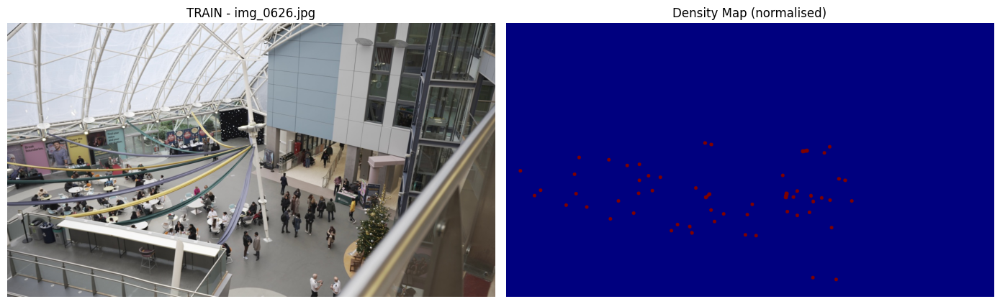

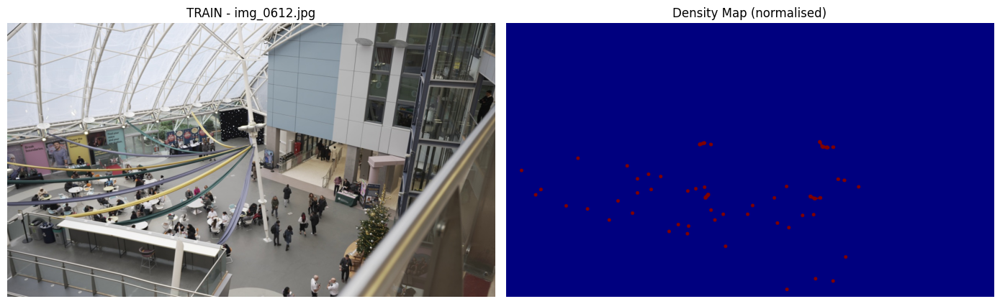

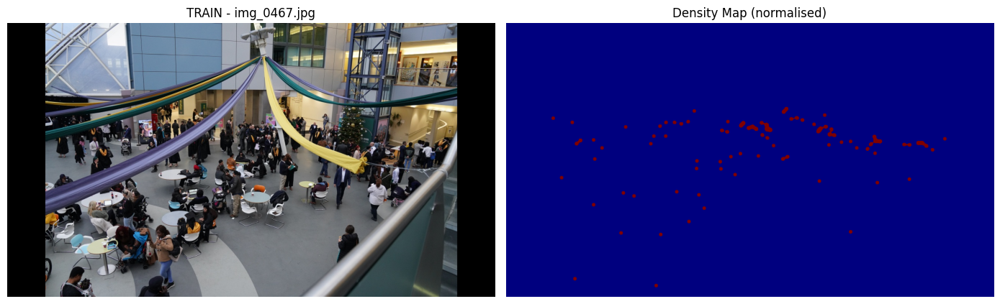


🔍 Previewing VAL samples...


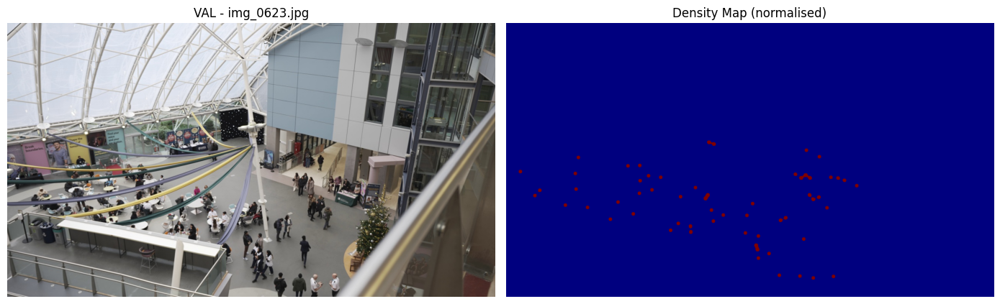

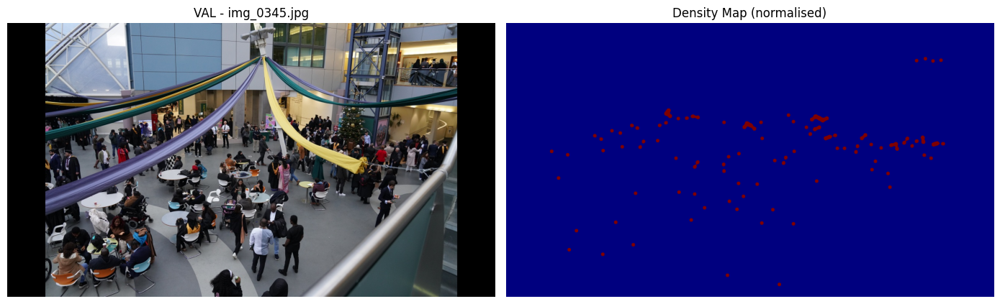

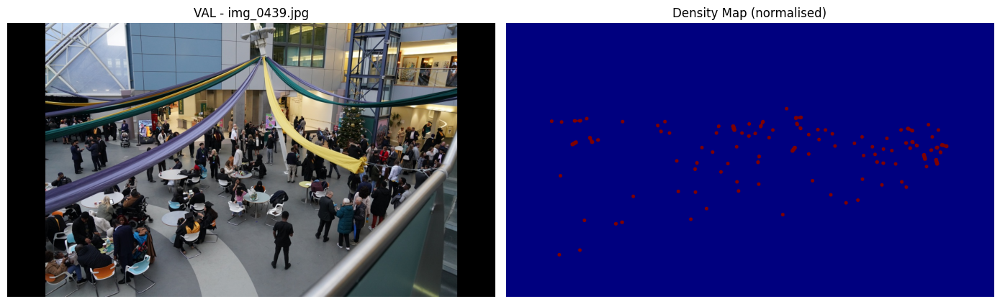


🔍 Previewing TEST samples...


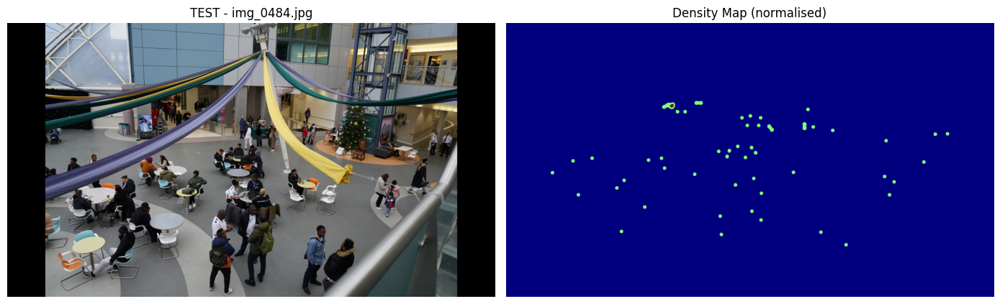

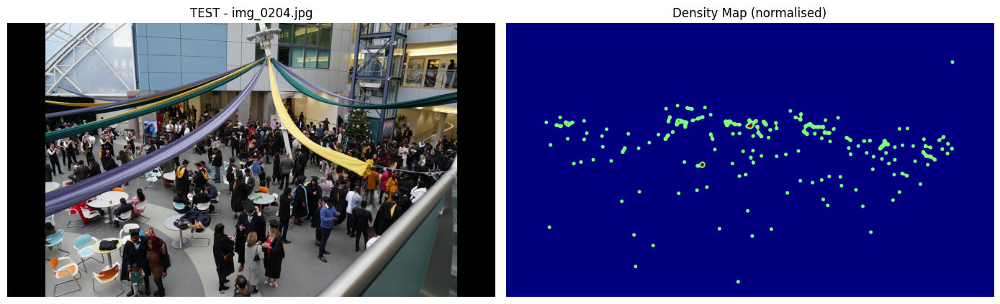

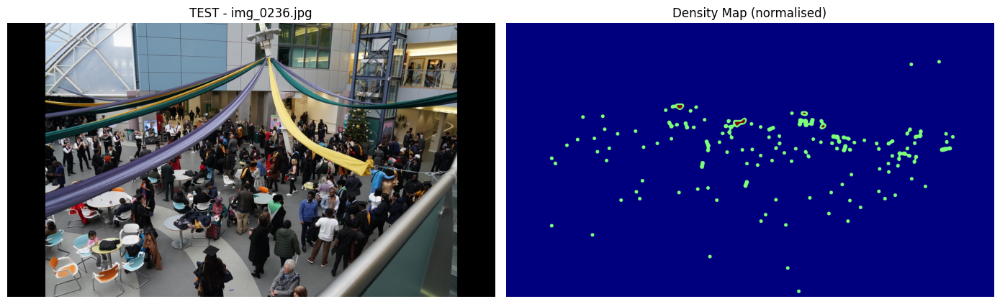

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Paths and config
splits = ["train", "val", "test"]
base_path = "data"
samples_per_split = 3

# Preview helper
def preview_split(split_name, num_samples=3):
    print(f"\n🔍 Previewing {split_name.upper()} samples...")
    image_dir = os.path.join(base_path, split_name, "images")
    map_dir = os.path.join(base_path, split_name, "density_maps")

    # Safety check
    all_images = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
    if len(all_images) < num_samples:
        print(f"⚠️ Not enough images in {split_name} to preview.")
        return

    selected = random.sample(all_images, num_samples)
    for filename in selected:
        img_path = os.path.join(image_dir, filename)
        map_path = os.path.join(map_dir, filename.replace(".jpg", ".png"))

        img = cv2.imread(img_path)
        density = cv2.imread(map_path, cv2.IMREAD_GRAYSCALE)

        if img is None or density is None:
            print(f"❌ Could not load image or map: {filename}")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        norm_density = density.astype(np.float32) / (density.max() + 1e-5)

        # Display
        fig, axs = plt.subplots(1, 2, figsize=(14, 6))
        axs[0].imshow(img_rgb)
        axs[0].set_title(f"{split_name.upper()} - {filename}")
        axs[0].axis('off')

        axs[1].imshow(norm_density, cmap="jet")
        axs[1].set_title("Density Map (normalised)")
        axs[1].axis('off')

        plt.tight_layout()
        plt.show()

# Preview all splits
for split in splits:
    preview_split(split, samples_per_split)


#Defining the CSRNet Architecture

CSRNet uses:

VGG-16 frontend (pre-trained, first 13 conv layers only).

A custom backend with dilated convolutions.

A final 1×1 conv layer to regress the density map.

In [ ]:
import torch
import torch.nn as nn
from torchvision.models import vgg16_bn, VGG16_BN_Weights

class CSRNet(nn.Module):
    def __init__(self, load_pretrained=True):
        super(CSRNet, self).__init__()

        if load_pretrained:
            weights = VGG16_BN_Weights.DEFAULT  # 🧠 Best-practice for pretrained model loading (PyTorch 2.0+)
        else:
            weights = None

        vgg = vgg16_bn(weights=weights)
        self.frontend = nn.Sequential(*list(vgg.features.children())[:33])  # Conv1_1 to Conv5_3

        self.backend = nn.Sequential(
            nn.Conv2d(512, 512, 3, padding=2, dilation=2), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, padding=2, dilation=2), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, padding=2, dilation=2), nn.ReLU(inplace=True),
            nn.Conv2d(512, 256, 3, padding=2, dilation=2), nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, 3, padding=2, dilation=2), nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, padding=2, dilation=2), nn.ReLU(inplace=True)
        )

        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)
        self._initialize_weights()

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x

    def _initialize_weights(self):
        # 🧼 Weight initialisation for backend & output layer
        for m in self.backend.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

        nn.init.kaiming_normal_(self.output_layer.weight, mode='fan_out', nonlinearity='relu')
        if self.output_layer.bias is not None:
            nn.init.constant_(self.output_layer.bias, 0)


#Testing CSRNet with One Image Sample

In [ ]:
import os
import cv2
import torch
import numpy as np
from torchvision import transforms

# Load CSRNet model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CSRNet().to(device)
model.eval()

# Load a sample image from training set
sample_image_path = "data/train/images/img_0001.jpg"  # Update this to test other images
if not os.path.exists(sample_image_path):
    raise FileNotFoundError(f"❌ Sample image not found: {sample_image_path}")

img = cv2.imread(sample_image_path)
if img is None:
    raise RuntimeError(f"❌ Failed to load image: {sample_image_path}")

# Convert BGR to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Preprocess for VGG-16
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])
img_tensor = transform(img_rgb).unsqueeze(0).to(device)  # [1, 3, H, W]

# Pass through the model
with torch.no_grad():
    output = model(img_tensor)

# Output info
predicted_count = output.sum().item()
print("✅ CSRNet test completed.")
print(f"📥 Input tensor shape:   {img_tensor.shape}")
print(f"📤 Output tensor shape:  {output.shape}")
print(f"🔢 Predicted total count: {predicted_count:.2f}")


Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:03<00:00, 167MB/s]


✅ CSRNet test completed.
📥 Input tensor shape:   torch.Size([1, 3, 720, 1280])
📤 Output tensor shape:  torch.Size([1, 1, 90, 160])
🔢 Predicted total count: 21533.40


#Defining a Custom CSRNetDataset

In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
import os
import cv2
import torch
import torch.nn.functional as F
import numpy as np

class CSRNetDataset(Dataset):
    def __init__(self, image_dir, density_dir, transform=None):
        self.image_dir = image_dir
        self.density_dir = density_dir
        self.image_files = sorted([
            f for f in os.listdir(image_dir)
            if f.lower().endswith(".jpg") and os.path.isfile(os.path.join(image_dir, f))
        ])
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_filename = self.image_files[idx]

        # --- Load and preprocess image ---
        img_path = os.path.join(self.image_dir, img_filename)
        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(f"❌ Could not read image: {img_filename}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Apply transform (or ToTensor by default)
        if self.transform:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)

        # --- Load and preprocess .npy density map ---
        density_path = os.path.join(self.density_dir, img_filename.replace(".jpg", ".npy"))
        if not os.path.exists(density_path):
            raise FileNotFoundError(f"❌ .npy density map not found for: {img_filename}")

        density_map = np.load(density_path).astype(np.float32)
        density_map = torch.from_numpy(density_map).unsqueeze(0)  # [1, H, W]

        # Resize ground truth map to match model output (1/8 resolution)
        density_map = F.interpolate(
            density_map.unsqueeze(0), scale_factor=1/8,
            mode='bilinear', align_corners=False
        ).squeeze(0)  # [1, H//8, W//8]

        return img, density_map



#Defining Transform and Loaders

In [ ]:
from torch.utils.data import DataLoader
from torchvision import transforms

# ✅ VGG-compatible preprocessing
vgg_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# ✅ Load from updated `.npy` paths
train_dataset = CSRNetDataset("data/train/images", "data/train/density_maps_npy", transform=vgg_transform)
val_dataset   = CSRNetDataset("data/val/images", "data/val/density_maps_npy", transform=vgg_transform)
test_dataset  = CSRNetDataset("data/test/images", "data/test/density_maps_npy", transform=vgg_transform)

# ✅ Sanity checks
assert len(train_dataset) > 0, "❌ Train dataset is empty!"
assert len(val_dataset) > 0, "❌ Val dataset is empty!"
assert len(test_dataset) > 0, "❌ Test dataset is empty!"

# ✅ DataLoaders
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)

# ✅ Summary
print("✅ Dataset loaders ready:")
print(f" - Training batches:   {len(train_loader)}")
print(f" - Validation batches: {len(val_loader)}")
print(f" - Testing batches:    {len(test_loader)}")

# ✅ Sample shapes
sample_img, sample_map = train_dataset[0]
print(f"Image shape: {sample_img.shape} | Density map shape: {sample_map.shape}")




✅ Dataset loaders ready:
 - Training batches:   105
 - Validation batches: 20
 - Testing batches:    20
Image shape: torch.Size([3, 720, 1280]) | Density map shape: torch.Size([1, 90, 160])


#Training Loop

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random

# 🔒 Reproducibility
def set_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(42)

# 🔧 Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 📦 Model
model = CSRNet().to(device)

# 📉 Loss & optimiser
criterion = nn.MSELoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-4)

# 🔁 Training setup
num_epochs = 10  # Update as needed
best_val_loss = float('inf')

# 📊 Store metrics
history = {
    'train_loss': [],
    'val_loss': [],
    'mae': [],
    'rmse': []
}

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for batch_idx, (images, targets) in enumerate(train_loader):
        images = images.float().to(device)
        targets = targets.float().to(device)

        outputs = model(images)
        loss = criterion(outputs, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # 🔍 Validation
    model.eval()
    val_loss = 0.0
    mae, rmse = 0.0, 0.0

    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(val_loader):
            images = images.float().to(device)
            targets = targets.float().to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

            pred_count = outputs.sum().item()
            true_count = targets.sum().item()
            mae += abs(pred_count - true_count)
            rmse += (pred_count - true_count) ** 2

    # 📊 Stats
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    mae /= len(val_loader)
    rmse = np.sqrt(rmse / len(val_loader))

    # 📈 Store epoch metrics
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['mae'].append(mae)
    history['rmse'].append(rmse)

    # 🖨️ Logging
    print(f"📅 Epoch {epoch+1:02}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | "
          f"Val Loss: {val_loss:.4f} | "
          f"MAE: {mae:.2f} | RMSE: {rmse:.2f}")

    # 💾 Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "/content/drive/MyDrive/crowd_density_project/csrnet_best.pth")
        print("💾 Best model saved at csrnet_best.pth")

print("✅ Training complete.")


📅 Epoch 01/10 | Train Loss: 0.5839 | Val Loss: 0.0839 | MAE: 160.25 | RMSE: 167.65
💾 Best model saved at csrnet_best.pth
📅 Epoch 02/10 | Train Loss: 0.0531 | Val Loss: 0.0330 | MAE: 92.70 | RMSE: 102.45
💾 Best model saved at csrnet_best.pth
📅 Epoch 03/10 | Train Loss: 0.0253 | Val Loss: 0.0214 | MAE: 184.18 | RMSE: 186.79
💾 Best model saved at csrnet_best.pth
📅 Epoch 04/10 | Train Loss: 0.0142 | Val Loss: 0.0108 | MAE: 60.10 | RMSE: 63.52
💾 Best model saved at csrnet_best.pth
📅 Epoch 05/10 | Train Loss: 0.0088 | Val Loss: 0.0070 | MAE: 26.55 | RMSE: 32.37
💾 Best model saved at csrnet_best.pth
📅 Epoch 06/10 | Train Loss: 0.0063 | Val Loss: 0.0061 | MAE: 23.10 | RMSE: 28.68
💾 Best model saved at csrnet_best.pth
📅 Epoch 07/10 | Train Loss: 0.0049 | Val Loss: 0.0053 | MAE: 31.99 | RMSE: 34.19
💾 Best model saved at csrnet_best.pth
📅 Epoch 08/10 | Train Loss: 0.0039 | Val Loss: 0.0032 | MAE: 34.18 | RMSE: 35.67
💾 Best model saved at csrnet_best.pth
📅 Epoch 09/10 | Train Loss: 0.0031 | Val Lo

#Visualizing Training & Validation Loss/MAE/RMSE Curves

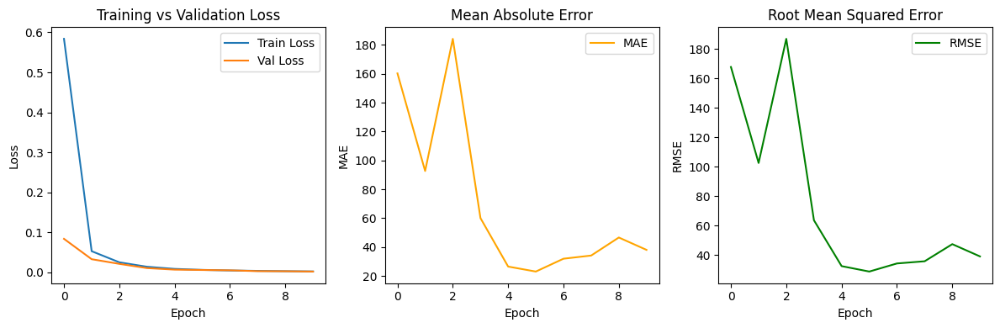

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 4))

# 🔹 Loss
plt.subplot(1, 3, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()

# 🔹 MAE
plt.subplot(1, 3, 2)
plt.plot(history['mae'], label='MAE', color='orange')
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Mean Absolute Error")
plt.legend()

# 🔹 RMSE
plt.subplot(1, 3, 3)
plt.plot(history['rmse'], label='RMSE', color='green')
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("Root Mean Squared Error")
plt.legend()

plt.tight_layout()
plt.show()


#Training 50 epochs

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
import os

# 🔒 Reproducibility
def set_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(42)

# 🔧 Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 📦 Model
model = CSRNet().to(device)

# 📉 Loss & optimiser
criterion = nn.MSELoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

# 🛑 Early stopping config
patience = 7
min_delta = 1e-4
early_stopping_counter = 0

# 📁 Save path for new checkpoint
version_path = "/content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth"

# 📊 Logging
num_epochs = 50
best_val_loss = float('inf')
history = {
    "train_loss": [],
    "val_loss": [],
    "mae": [],
    "rmse": []
}

# 🔁 Training loop
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    for images, targets in train_loader:
        images = images.float().to(device)
        targets = targets.float().to(device)

        outputs = model(images)
        loss = criterion(outputs, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # 🔍 Validation
    model.eval()
    val_loss = 0.0
    mae, rmse = 0.0, 0.0

    with torch.no_grad():
        for images, targets in val_loader:
            images = images.float().to(device)
            targets = targets.float().to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

            pred_count = outputs.sum().item()
            true_count = targets.sum().item()
            mae += abs(pred_count - true_count)
            rmse += (pred_count - true_count) ** 2

    # 📊 Stats
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    mae /= len(val_loader)
    rmse = np.sqrt(rmse / len(val_loader))

    # 💾 Log history
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["mae"].append(mae)
    history["rmse"].append(rmse)

    print(f"📅 Epoch {epoch+1:02}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | "
          f"Val Loss: {val_loss:.4f} | "
          f"MAE: {mae:.2f} | RMSE: {rmse:.2f}")

    # 💾 Save best checkpoint
    if val_loss + min_delta < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0
        torch.save(model.state_dict(), version_path)
        print(f"💾 Best model saved at {version_path}")
    else:
        early_stopping_counter += 1

    # 🛑 Stop if no improvement
    if early_stopping_counter >= patience:
        print(f"⏹️ Early stopping triggered at epoch {epoch+1}")
        break

    # 📉 Adjust LR
    scheduler.step()

print("✅ Training complete.")


📅 Epoch 01/50 | Train Loss: 0.5838 | Val Loss: 0.0839 | MAE: 160.78 | RMSE: 168.27
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth
📅 Epoch 02/50 | Train Loss: 0.0531 | Val Loss: 0.0330 | MAE: 91.39 | RMSE: 101.07
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth
📅 Epoch 03/50 | Train Loss: 0.0253 | Val Loss: 0.0214 | MAE: 183.47 | RMSE: 186.05
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth
📅 Epoch 04/50 | Train Loss: 0.0142 | Val Loss: 0.0108 | MAE: 59.85 | RMSE: 63.34
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth
📅 Epoch 05/50 | Train Loss: 0.0088 | Val Loss: 0.0070 | MAE: 26.62 | RMSE: 32.42
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth
📅 Epoch 06/50 | Train Loss: 0.0063 | Val Loss: 0.0061 | MAE: 23.16 | RMSE: 28.68
💾 Best model saved at /content/drive/MyDrive/crowd_density_project/csrnet_best_

#Testing

✅ Loaded best model from csrnet_best_v2.pth


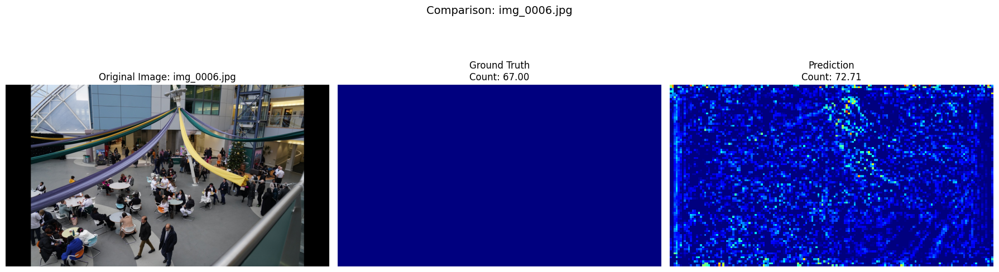

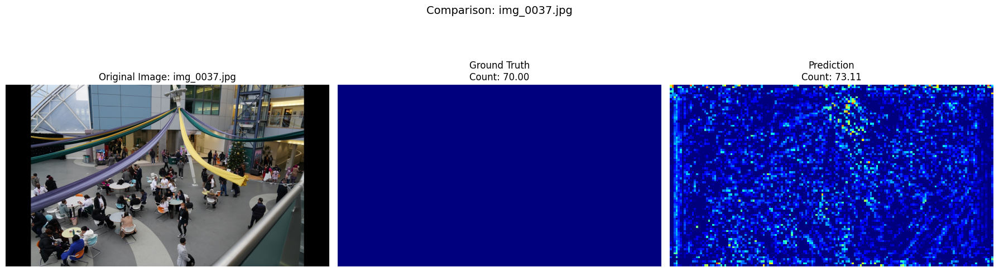

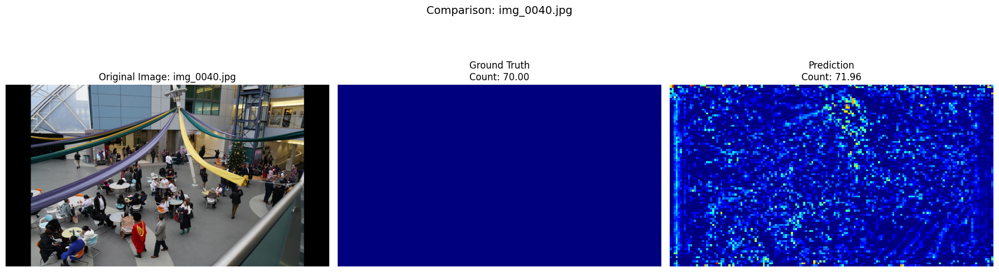

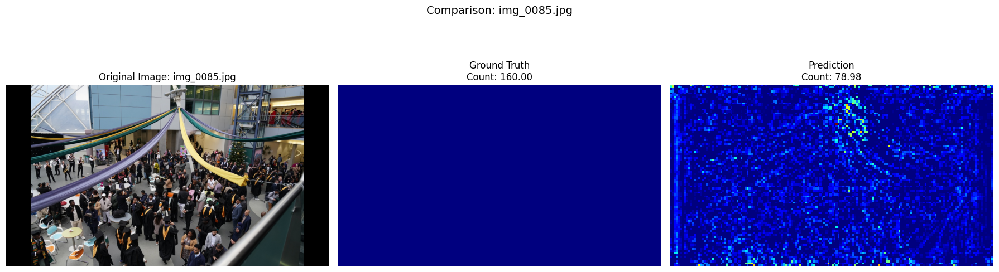

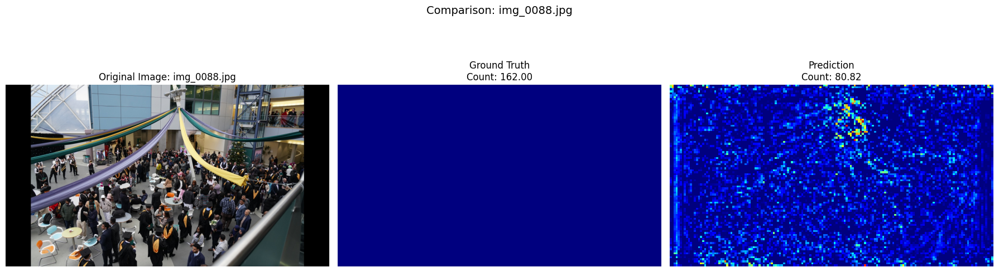

In [ ]:
import torch
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

# Load best model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CSRNet().to(device)
model.load_state_dict(torch.load("/content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth"))
model.eval()
print("✅ Loaded best model from csrnet_best_v2.pth")

# Paths
test_image_dir = "data/test/images"
test_density_npy_dir = "data/test/density_maps_npy"  # .npy files
test_density_png_dir = "data/test/density_maps"  # .png just for visualisation

# Preview some test images
test_images = sorted(os.listdir(test_image_dir))[:5]  # Pick first 5 images

for filename in test_images:
    img_path = os.path.join(test_image_dir, filename)
    gt_npy_path = os.path.join(test_density_npy_dir, filename.replace(".jpg", ".npy"))
    gt_png_path = os.path.join(test_density_png_dir, filename.replace(".jpg", ".png"))

    # --- Load image ---
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Could not load image: {filename}")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # --- Preprocess for model ---
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])
    img_tensor = transform(img_rgb).unsqueeze(0).float().to(device)

    # --- Load GT from .npy ---
    if not os.path.exists(gt_npy_path):
        print(f"❌ Missing .npy file: {gt_npy_path}")
        continue
    gt_map = np.load(gt_npy_path)  # Already at 1/8 scale
    gt_count = np.sum(gt_map)

    # --- Predict using model ---
    with torch.no_grad():
        pred_map = model(img_tensor).squeeze().cpu().numpy()
        pred_map = np.clip(pred_map, 0, None)  # Remove negative values
    pred_count = np.sum(pred_map)

    # --- Visualize ---
    # Optionally load the .png version for better color heatmap
    if os.path.exists(gt_png_path):
        vis_gt_map = cv2.imread(gt_png_path, cv2.IMREAD_GRAYSCALE)
        vis_gt_map = vis_gt_map.astype(np.float32) / 10000.0  # scale back if needed
    else:
        vis_gt_map = gt_map

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img_rgb)
    axs[0].set_title(f"Original Image: {filename}")
    axs[0].axis("off")

    axs[1].imshow(vis_gt_map, cmap="jet")
    axs[1].set_title(f"Ground Truth\nCount: {gt_count:.2f}")
    axs[1].axis("off")

    axs[2].imshow(pred_map, cmap="jet")
    axs[2].set_title(f"Prediction\nCount: {pred_count:.2f}")
    axs[2].axis("off")

    plt.suptitle(f"Comparison: {filename}", fontsize=14)
    plt.tight_layout()
    plt.show()


✅ Model loaded from: /content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth


🔍 Evaluating test set:   0%|          | 0/20 [00:00<?, ?it/s]

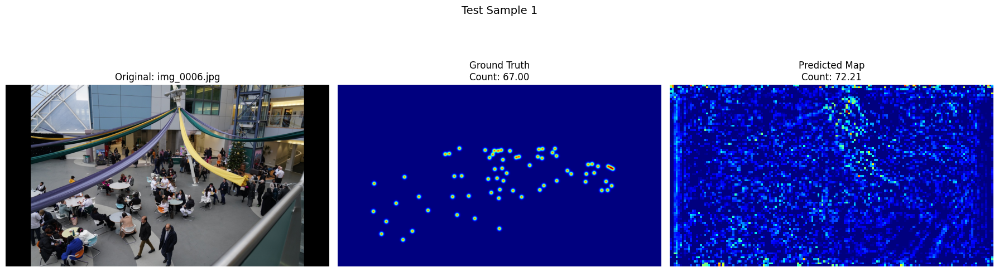

🔍 Evaluating test set:   5%|▌         | 1/20 [00:01<00:21,  1.13s/it]

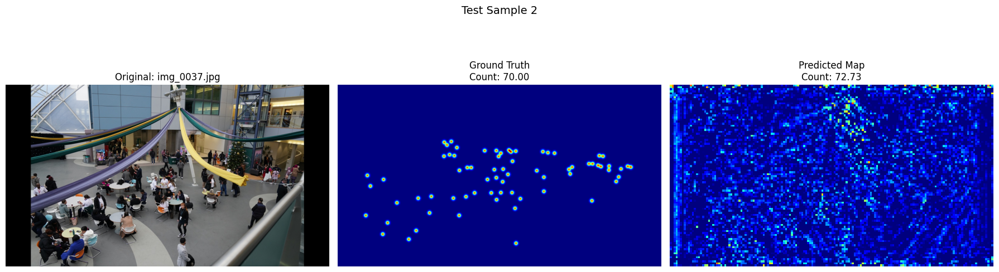

🔍 Evaluating test set:  10%|█         | 2/20 [00:02<00:23,  1.32s/it]

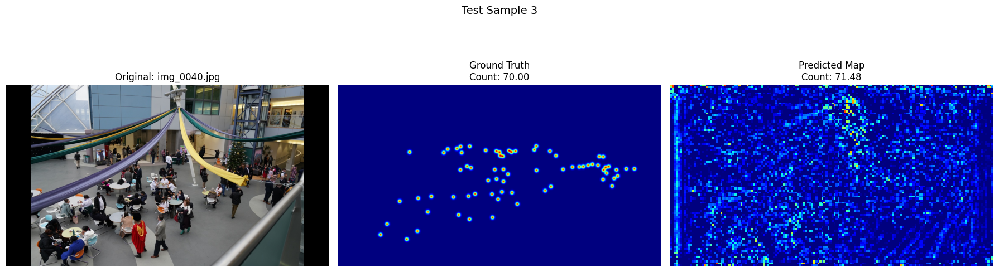

🔍 Evaluating test set:  15%|█▌        | 3/20 [00:04<00:23,  1.39s/it]

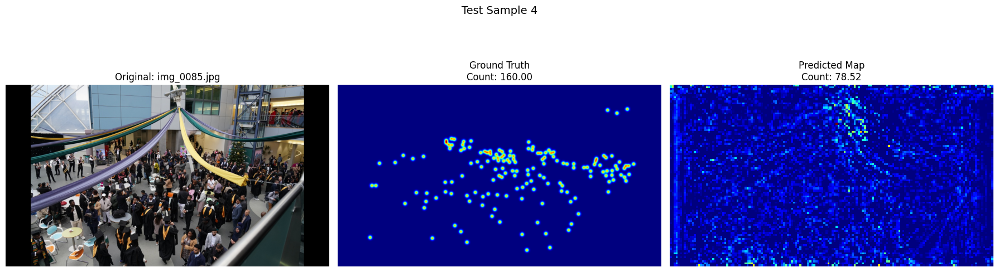

🔍 Evaluating test set:  20%|██        | 4/20 [00:05<00:22,  1.39s/it]

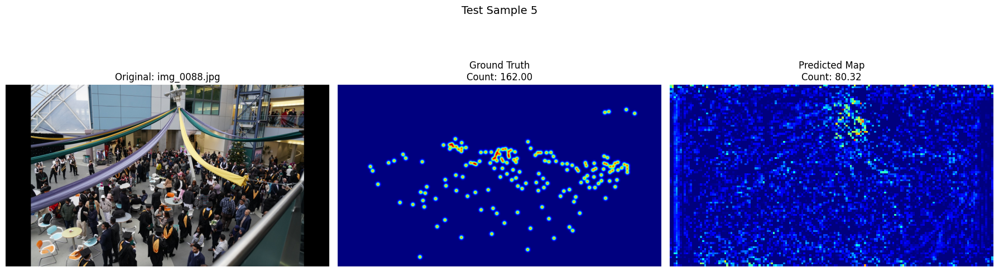

🔍 Evaluating test set: 100%|██████████| 20/20 [00:25<00:00,  1.27s/it]


 Final Test Evaluation Metrics:
 MAE : 45.94
 RMSE: 62.91


In [ ]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm import tqdm

# --- Config ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/content/drive/MyDrive/crowd_density_project/csrnet_best_v2.pth"
test_img_dir = "data/test/images"
test_npy_dir = "data/test/density_maps"  # 🧠 Must point to the new .npy density map directory
visualise_samples = 5

# --- Load Model ---
model = CSRNet().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print(f"✅ Model loaded from: {model_path}")

# --- VGG Normalisation ---
vgg_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# --- Test Files ---
test_filenames = sorted([
    f for f in os.listdir(test_img_dir) if f.endswith(".jpg")
])

# --- Evaluation ---
mae, rmse = 0.0, 0.0

for i, filename in enumerate(tqdm(test_filenames, desc="🔍 Evaluating test set")):
    img_path = os.path.join(test_img_dir, filename)
    gt_path = os.path.join(test_npy_dir, filename.replace(".jpg", ".npy"))

    # Load image
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Could not load: {filename}")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    input_tensor = vgg_transform(img_rgb).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        output = model(input_tensor)
        pred_map = output.squeeze().cpu().numpy()
        pred_map = np.clip(pred_map, 0, None)
        pred_count = pred_map.sum()

    # Load GT .npy
    gt_map = np.load(gt_path)
    true_count = gt_map.sum()

    # Metrics
    mae += abs(pred_count - true_count)
    rmse += (pred_count - true_count) ** 2

    # Optional: Visualise
    if i < visualise_samples:
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))
        axs[0].imshow(img_rgb)
        axs[0].set_title(f"Original: {filename}")
        axs[0].axis('off')

        axs[1].imshow(gt_map.squeeze(), cmap="jet")
        axs[1].set_title(f"Ground Truth\nCount: {true_count:.2f}")
        axs[1].axis('off')

        axs[2].imshow(pred_map, cmap="jet")
        axs[2].set_title(f"Predicted Map\nCount: {pred_count:.2f}")
        axs[2].axis('off')

        plt.suptitle(f"Test Sample {i+1}", fontsize=14)
        plt.tight_layout()
        plt.show()

# --- Final Metrics ---
mae /= len(test_filenames)
rmse = np.sqrt(rmse / len(test_filenames))

print("\n Final Test Evaluation Metrics:")
print(f" MAE : {mae:.2f}")
print(f" RMSE: {rmse:.2f}")


<ipython-input-1-2903a39d51f0>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=names, y=values, palette=colors)


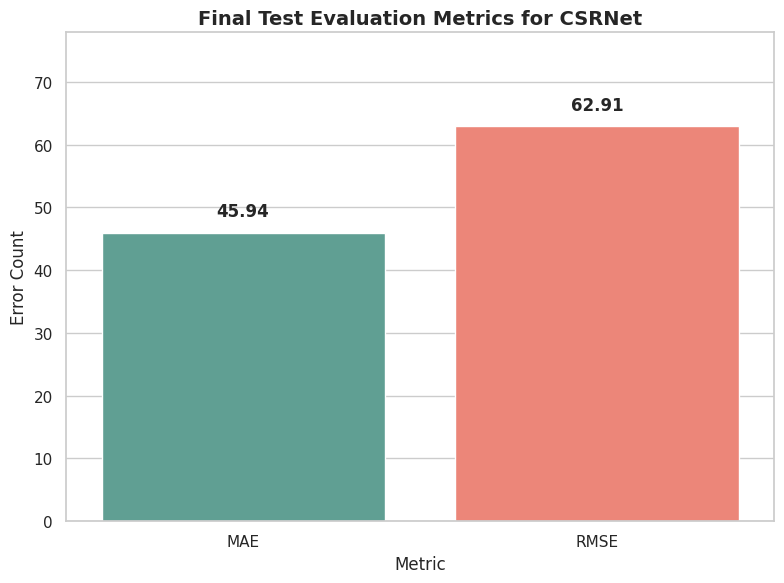

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style
sns.set(style="whitegrid")

# Metrics from test evaluation
metrics = {'MAE': 45.94, 'RMSE': 62.91}
names = list(metrics.keys())
values = list(metrics.values())

# Define bar colors
colors = ['#5A9', '#F76']

# Create barplot
plt.figure(figsize=(8, 6))
bars = sns.barplot(x=names, y=values, palette=colors)

# Annotate values on bars
for i, bar in enumerate(bars.patches):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 2,
        f'{values[i]:.2f}',
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

# Axis and title
plt.ylim(0, max(values) + 15)
plt.title("Final Test Evaluation Metrics for CSRNet", fontsize=14, fontweight='bold')
plt.ylabel("Error Count")
plt.xlabel("Metric")

# Show plot
plt.tight_layout()
plt.show()
